In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from collections import namedtuple
import ydata_profiling  # Use ydata_profiling instead of pandas_profiling
from IPython.display import display

# Load the dataset with the correct encoding
df = pd.read_csv(r"C:\Users\VAIBHAV ADMANE\OneDrive\Desktop\IMDb Movies India.csv", encoding='latin1')
df.head()


,Name,Year,Duration,Genre,Rating,Votes,Director,Actor 1,Actor 2,Actor 3
0,,NaN,NaN,Drama,NaN,NaN,J.S. Randhawa,Manmauji,Birbal,Rajendra Bhatia
1,#Gadhvi (He thought he was Gandhi),(2019),109 min,Drama,7.0,8,Gaurav Bakshi,Rasika Dugal,Vivek Ghamande,Arvind Jangid
2,#Homecoming,(2021),90 min,"Drama, Musical",NaN,NaN,Soumyajit Majumdar,Sayani Gupta,Plabita Borthakur,Roy Angana
3,#Yaaram,(2019),110 min,"Comedy, Romance",4.4,35,Ovais Khan,Prateik,Ishita Raj,Siddhant Kapoor
4,...And Once Again,(2010),105 min,Drama,NaN,NaN,Amol Palekar,Rajat Kapoor,Rituparna Sengupta,Antara Mali


In [9]:
# Generate a Pandas Profiling Report for initial data exploration
report = pandas_profiling.ProfileReport(df)
display(report)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
# Remove rows with missing values in columns 1 to 9
df.dropna(subset=df.columns[1:9], how='all', inplace=True)
# Remove duplicate rows based on 'Name' and 'Year'
df.drop_duplicates(subset=['Name', 'Year'], keep='first', inplace=True)
# Remove rows with missing values in columns 1, 2, 4, and 5 (excluding 'Genre')
df.dropna(subset=df.columns[[1, 2, 4, 5]], how='all', inplace=True)
# Clean 'Year' and 'Duration' columns
df['Year'] = df['Year'].str.replace(r'[()]', '', regex=True)
df['Duration'] = df['Duration'].str.replace(r' min', '', regex=True)
# Remove rows with 'Year' equal to '2022'
df = df[df['Year'] != '2022']
# Display the cleaned dataset shape
print(f"Cleaned dataset shape: {df.shape}")

Cleaned dataset shape: (15046, 10)


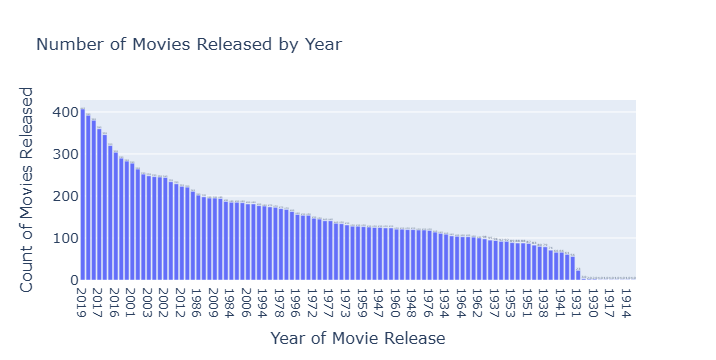

In [13]:
# Plot the number of movies released by year
year_count = df['Year'].value_counts().reset_index()
year_count.columns = ['Year', 'Count']
fig = px.bar(year_count, x='Year', y='Count', text='Count', title='Number of Movies Released by Year')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    xaxis=dict(title='Year of Movie Release', titlefont_size=16),
    yaxis=dict(title='Count of Movies Released', titlefont_size=16, tickfont_size=14)
)
fig.show()

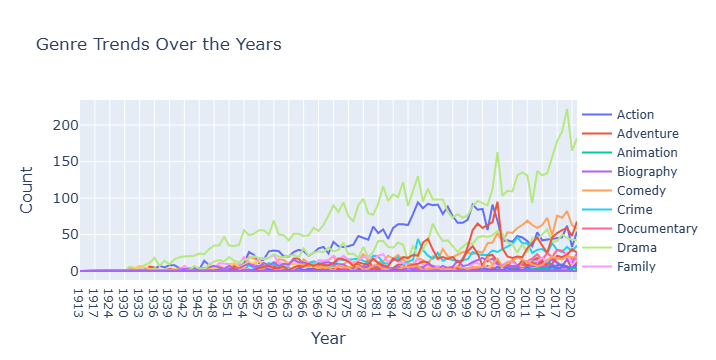

In [14]:
# Create dummy columns for each genre
dummies = df['Genre'].str.get_dummies(', ')
df_genre = pd.concat([df, dummies], axis=1)
# Plot genre trends over the years
genre_columns = df_genre.columns[10:]  # Assuming genre columns start from the 11th column
genre_count_by_year = df_genre.groupby('Year')[genre_columns].sum().reset_index()

fig = go.Figure()
for genre in genre_columns:
    fig.add_trace(go.Scatter(x=genre_count_by_year['Year'], y=genre_count_by_year[genre],
                             mode='lines', name=genre))

fig.update_layout(
    title='Genre Trends Over the Years',
    xaxis=dict(title='Year', titlefont_size=16),
    yaxis=dict(title='Count', titlefont_size=16, tickfont_size=14),
    legend=dict(y=0, x=1.0, bgcolor='rgba(255, 255, 255, 0)', bordercolor='rgba(255, 255, 255, 0)')
)
fig.show()

In [15]:
# Create a dataframe for actors and their movie counts by year
actor_cols = ['Actor 1', 'Actor 2', 'Actor 3']
actor_df = pd.melt(df[['Year'] + actor_cols], id_vars=['Year'], value_vars=actor_cols, var_name='Actor', value_name='Movie_Count')
actor_df.dropna(subset=['Actor'], inplace=True)

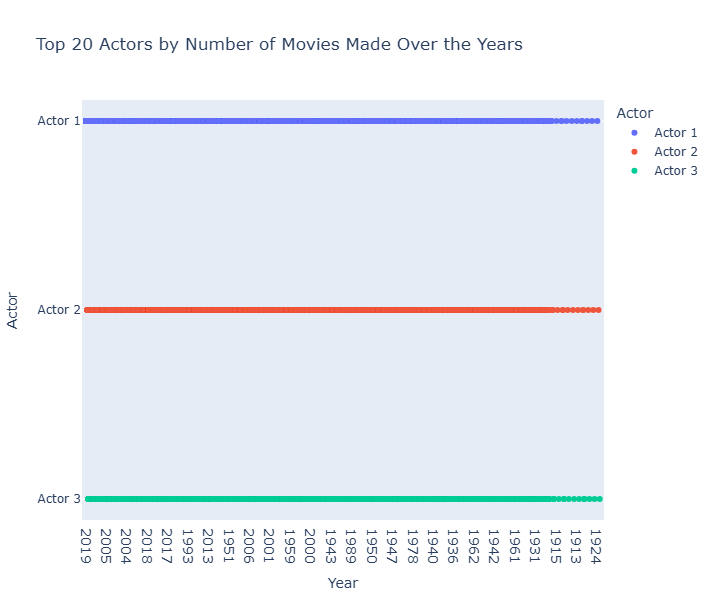

In [16]:
# Get the top 20 actors by movie count
top_20_actors = actor_df['Actor'].value_counts().head(20).index.tolist()
top_20_actor_df = actor_df[actor_df['Actor'].isin(top_20_actors)]
# Plot the top 20 actors by movie count over the years
fig = px.strip(top_20_actor_df, x='Year', y='Actor', color='Actor', title='Top 20 Actors by Number of Movies Made Over the Years')
fig.update_layout(
    xaxis_tickfont_size=14,
    height=600
)
fig.show()

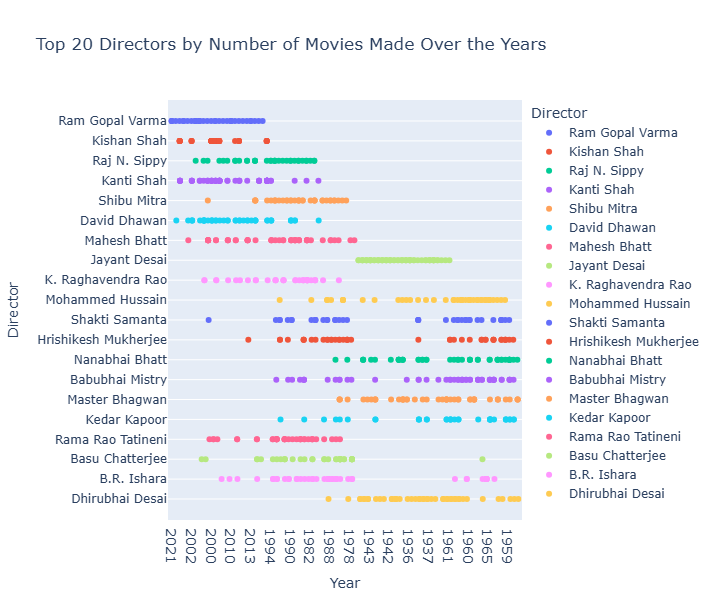

In [17]:
# Top Directors Analysis
director_df = df[['Director', 'Year']].dropna()
director_df['Movie_Count'] = 1
# Get the top 20 directors by movie count
top_20_directors = director_df['Director'].value_counts().head(20).index.tolist()
top_20_director_df = director_df[director_df['Director'].isin(top_20_directors)]
# Plot the top 20 directors by movie count over the years
fig = px.strip(top_20_director_df, x='Year', y='Director', color='Director', title='Top 20 Directors by Number of Movies Made Over the Years')
fig.update_layout(
    xaxis_tickfont_size=14,
    height=600
)
fig.show()

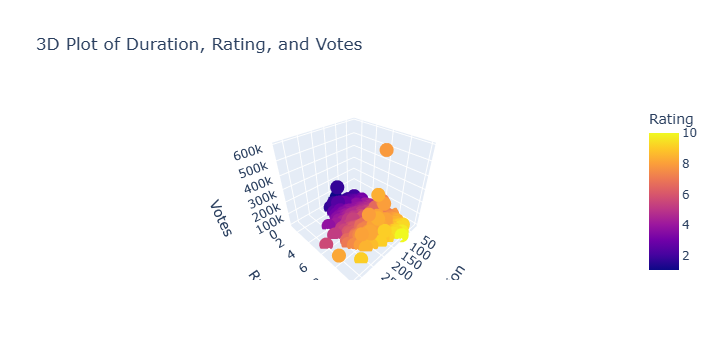

In [23]:
# Duration, Rating, and Votes Analysis
dur_rat = df[['Duration', 'Rating', 'Votes']].dropna()
dur_rat['Duration'] = dur_rat['Duration'].str.replace(' min', '').astype(int)
dur_rat['Votes'] = dur_rat['Votes'].str.replace(',', '').astype(float)
# 3D Scatter Plot of Duration, Rating, and Votes
fig = px.scatter_3d(dur_rat, x='Duration', y='Rating', z='Votes', color='Rating', title='3D Plot of Duration, Rating, and Votes')
fig.show()